In [2]:
import numpy as np
import pandas as pd
import random
import networkx as nx
from IPython.display import Image
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn import metrics

In [3]:
G = nx.read_gml("crowdtangleCollections.gml")

# pos = nx.spring_layout(GMissingEdges)
# # nx.draw(GMissingEdges, cmap = plt.get_cmap('rainbow'), with_labels=True, pos=pos)

# n = GMissingEdges.number_of_nodes()
# m = GMissingEdges.number_of_edges()
# print("Number of nodes : %d" % n)
# print("Number of edges : %d" % m)
# print("Number of connected components : %d" % nx.number_connected_components(GMissingEdges))

In [11]:
# Remove 20% das arestas
proportion_edges = 0.2
edge_subset = random.sample(G.edges(), int(proportion_edges * G.number_of_edges()))

# Cria uma cópia do grafo e remove arestas
GEdgesTrain = G.copy()
GEdgesTrain.remove_edges_from(edge_subset)
print(GEdgesTrain.nodes(data=True))

# Remove atributo name
nodes = dict([((u),d) for u,d in GEdgesTrain.nodes(data=True)])
for key,item in nodes.items():
    del GEdgesTrain.nodes[key]['retweetedUrl']
    del GEdgesTrain.nodes[key]['rphText']
    del GEdgesTrain.nodes[key]['meanSubscriberCount']
    del GEdgesTrain.nodes[key]['meanScore']
    del GEdgesTrain.nodes[key]['medianSubscriberCount']
    del GEdgesTrain.nodes[key]['medianScore']


[('collection0001', {'retweetedUrl': 'https://noticias.uol.com.br/politica/eleicoes/2018/noticias/2018/10/21/editorial-new-york-times-bolsonaro-escolha-triste-do-brasil.htm?utm_source=twitter&utm_medium=social-media&utm_campaign=noticias&utm_content=geral', 'rph': -0.5192160914061217, 'retweetsCount': 1549, 'documentsCount': 383, 'meanSubscriberCount': 94169.04, 'meanScore': -3.15, 'medianSubscriberCount': 0.0, 'medianScore': -0.44, 'rphText': 'Esquerda', 'reactionCountActual': 0.66, 'reactionCountExpected': 0.23, 'louvainCluster': 0}), ('collection0002', {'retweetedUrl': 'https://oantagonista.com/?p=123030', 'rph': 0.6378662244034333, 'retweetsCount': 1313, 'documentsCount': 948915, 'meanSubscriberCount': 148015.86, 'meanScore': -16.75, 'medianSubscriberCount': 0.0, 'medianScore': -2.38, 'rphText': 'Direita', 'reactionCountActual': 0.51, 'reactionCountExpected': 0.24, 'louvainCluster': 1}), ('collection0003', {'retweetedUrl': 'https://noticias.uol.com.br/politica/eleicoes/2018/noticia

In [5]:
dfToEvaluate = pd.DataFrame(edge_subset)
dfToEvaluate = dfToEvaluate.rename(columns={0:'venue1',1:'venue2'})
dfToEvaluate.to_csv("edgesToEvaluateTest.csv", index_label='linkID')
dfToEvaluate

,venue1,venue2
0,collection0174,collection0502
1,collection0011,collection0040
2,collection0082,collection0176
3,collection0085,collection1790
4,collection1025,collection1399
...,...,...
6700,collection0104,collection1013
6701,collection0475,collection0509
6702,collection0084,collection0454
6703,collection0058,collection0525


In [10]:
# Fazendo previsões com o jaccard
pred_jaccard = list(nx.jaccard_coefficient(GEdgesTrain))

pred_jaccard = sorted(pred_jaccard, key=lambda tup: tup[2], reverse=True)

for item in pred_jaccard:
    print(item)


('collection1260', 'collection0412', 1.0)
('collection1260', 'collection1421', 1.0)
('collection1260', 'collection2283', 1.0)
('collection1260', 'collection1664', 1.0)
('collection1260', 'collection0716', 1.0)
('collection0412', 'collection1421', 1.0)
('collection0412', 'collection1664', 1.0)
('collection0412', 'collection0716', 1.0)
('collection0412', 'collection2283', 1.0)
('collection1421', 'collection1664', 1.0)
('collection1421', 'collection0716', 1.0)
('collection1421', 'collection2283', 1.0)
('collection1422', 'collection1143', 1.0)
('collection0536', 'collection0604', 1.0)
('collection0536', 'collection0762', 1.0)
('collection0762', 'collection0604', 1.0)
('collection1000', 'collection1011', 1.0)
('collection2283', 'collection1664', 1.0)
('collection2283', 'collection0716', 1.0)
('collection1664', 'collection0716', 1.0)
('collection0688', 'collection1453', 0.8571428571428571)
('collection1260', 'collection0688', 0.8333333333333334)
('collection1260', 'collection0119', 0.8333333

In [8]:
score_jaccard = [s for (u,v,s) in pred_jaccard]
score_jaccard

[0.05660377358490566,
 0.07692307692307693,
 0.02564102564102564,
 0.046875,
 0.5,
 0.08571428571428572,
 0.3333333333333333,
 0.375,
 0.02702702702702703,
 0.035398230088495575,
 0.030303030303030304,
 0.09523809523809523,
 0.07407407407407407,
 0.042105263157894736,
 0.1,
 0.05555555555555555,
 0.010830324909747292,
 0.02185792349726776,
 0.011904761904761904,
 0.06779661016949153,
 0.014814814814814815,
 0.047619047619047616,
 0.017094017094017096,
 0.17647058823529413,
 0.06521739130434782,
 0.8,
 0.2,
 0.08823529411764706,
 0.039473684210526314,
 0.09375,
 0.028846153846153848,
 0.013333333333333334,
 0.03125,
 0.021739130434782608,
 0.12,
 0.07692307692307693,
 0.13636363636363635,
 0.0297029702970297,
 0.18181818181818182,
 0.5,
 0.0425531914893617,
 0.034482758620689655,
 0.09090909090909091,
 0.0,
 0.06349206349206349,
 0.0234375,
 0.07692307692307693,
 0.10810810810810811,
 0.014705882352941176,
 0.009345794392523364,
 0.08333333333333333,
 0.01834862385321101,
 0.03896103896

In [9]:
label_jaccard = [(u,v) in edge_subset for (u,v,s) in pred_jaccard]
label_jaccard

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,


In [10]:
# Computa o AUC score da curva ROC
fpr_jaccard, tpr_jaccard, _ = metrics.roc_curve(label_jaccard, score_jaccard)
auc_jaccard = roc_auc_score(label_jaccard, score_jaccard)
print(auc_jaccard)

0.8439693988168684


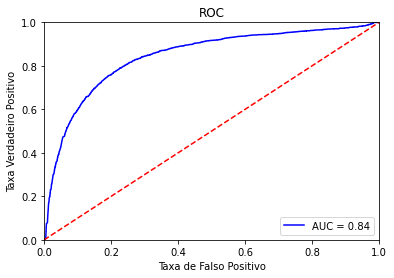

In [11]:
import matplotlib.pyplot as plt
plt.title('ROC')
plt.plot(fpr_jaccard, tpr_jaccard, 'b', label = 'AUC = %0.2f' % auc_jaccard)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('Taxa Verdadeiro Positivo')
plt.xlabel('Taxa de Falso Positivo')
plt.show()